In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium import plugins
import osmnx as ox
import networkx as nx
import plotly.express as px
from ortools.constraint_solver import pywrapcp, routing_enums_pb2
import chardet

In [2]:
with open("data/Starbucks Store Locations.csv", "rb") as f:
    result = chardet.detect(f.read())

encoding = result["encoding"]

In [3]:
cidades = [
    # "Barueri",
    # "Bauru",
    # "Campinas",
    # "Guarulhos",
    # "Piracicaba",
    # "Ribeirao Preto",
    # "Santo Andre",
    # "Santos",
    # "Sao Bernardo do Campo",
    # "Sao Caetano",
    # "Sao Jose do Campos",
    # "Sao Jose do Rio Preto",
    # "Sao Jose dos Campos",
    "Sao Paulo",
    # "Sorocaba",
]

data_starbucks = pd.read_csv("data/Starbucks Store Locations.csv", encoding=encoding)

In [4]:
# np.set_printoptions(threshold=np.inf)

In [5]:
data_starbucks.head()

,Brand,Store Number,Store Name,Ownership Type,Street Address,City,State/Province,Country,Postcode,Phone Number,Timezone,Longitude,Latitude
0,Starbucks,47370-257954,"Meritxell, 96",Licensed,"Av. Meritxell, 96",Andorra la Vella,7,AD,AD500,376818720,GMT+1:00 Europe/Andorra,1.53,42.51
1,Starbucks,22331-212325,Ajman Drive Thru,Licensed,"1 Street 69, Al Jarf",Ajman,AJ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,55.47,25.42
2,Starbucks,47089-256771,Dana Mall,Licensed,Sheikh Khalifa Bin Zayed St.,Ajman,AJ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,55.47,25.39
3,Starbucks,22126-218024,Twofour 54,Licensed,Al Salam Street,Abu Dhabi,AZ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,54.38,24.48
4,Starbucks,17127-178586,Al Ain Tower,Licensed,"Khaldiya Area, Abu Dhabi Island",Abu Dhabi,AZ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,54.54,24.51


In [6]:
data_starbucks = data_starbucks[data_starbucks["City"].isin(cidades)][
    ["City", "Street Address", "Latitude", "Longitude"]
].reset_index(drop=True)

data_starbucks = data_starbucks.reset_index().rename(
    columns={"index": "id", "Latitude": "y", "Longitude": "x"}
)

print(
    f"Foi feito um filtro nas cidades, agora o dataset tem um total de {len(data_starbucks)} cidades"
)

Foi feito um filtro nas cidades, agora o dataset tem um total de 48 cidades Brasileiras


In [7]:
i = 0
data_starbucks["base"] = data_starbucks["id"].apply(lambda x: 1 if x == i else 0)
start = data_starbucks[data_starbucks["base"] == 1][["y", "x"]].values[0]
print(f"A cidade de {data_starbucks.City[0]} foi escolhida como base.")

A cidade de Sao Paulo foi escolhida como base.


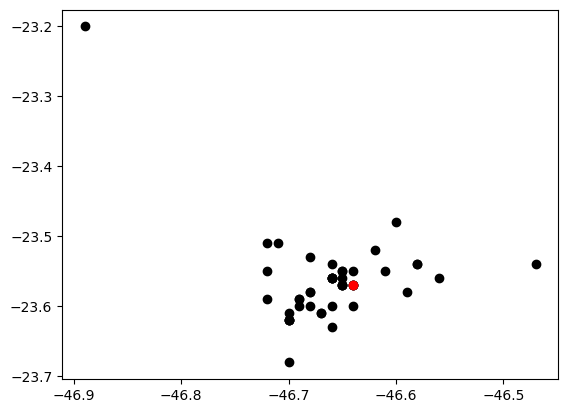

In [8]:
plt.scatter(y=data_starbucks["y"], x=data_starbucks["x"], color="black")
plt.scatter(y=start[0], x=start[1], color="red")
plt.show()

In [9]:
data = data_starbucks.copy()
color = "base"
lst_colors = ["black", "red"]
popup = "id"

map_ = folium.Map(location=start, tiles="cartodbpositron", zoom_start=11)

lst_elements = sorted(list(data[color].unique()))
data["color"] = data[color].apply(lambda x: lst_colors[lst_elements.index(x)])

data.apply(
    lambda row: folium.CircleMarker(
        location=[row["y"], row["x"]],
        popup=row[popup],
        color=row["color"],
        fill=True,
        radius=5,
    ).add_to(map_),
    axis=1,
)

plugins.Fullscreen(
    position="topright", title="Expand", title_cancel="Exit", force_separate_button=True
).add_to(map_)

map_

In [10]:
for i in range(len(data_starbucks)):
    points = [start, data_starbucks[["y", "x"]].iloc[i].tolist()]
    folium.PolyLine(
        points, tooltip="Coast", color="red", weight=0.5, opacity=0.5
    ).add_to(map_)

map_

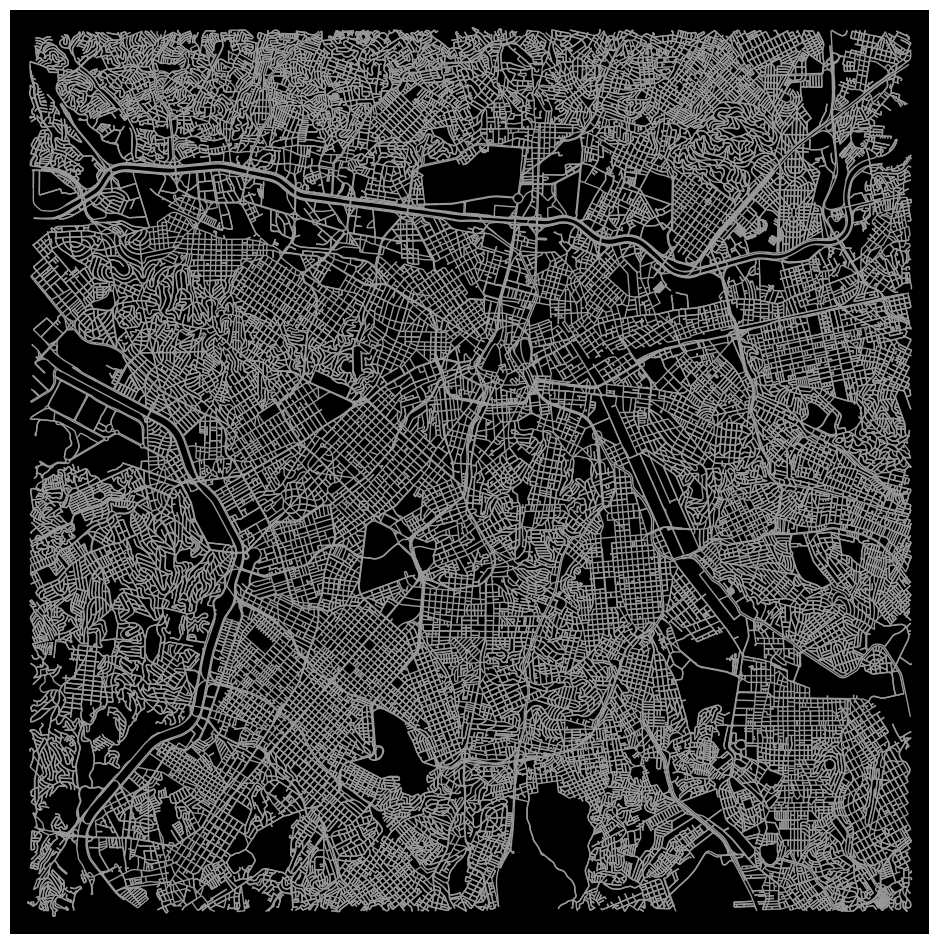

In [11]:
G = ox.graph_from_point(start, dist=10000, network_type="drive")
G = ox.add_edge_speeds(G)
G = ox.add_edge_travel_times(G)

fig, ax = ox.plot_graph(
    G, bgcolor="black", node_size=0, node_color="white", figsize=(25, 12)
)

In [12]:
end = data_starbucks[data_starbucks["id"] == 1][["y", "x"]].values[0]
print("locations: from", start, "--> to", end)

locations: from [-23.57 -46.64] --> to [-23.63 -46.66]


In [13]:
start_node = ox.distance.nearest_nodes(G, start[1], start[0])
end_node = ox.distance.nearest_nodes(G, end[1], end[0])
print("nodes: from", start_node, "--> to", end_node)

nodes: from 778098426 --> to 6361292097


In [14]:
nx.has_path(G, source=start_node, target=end_node)

True

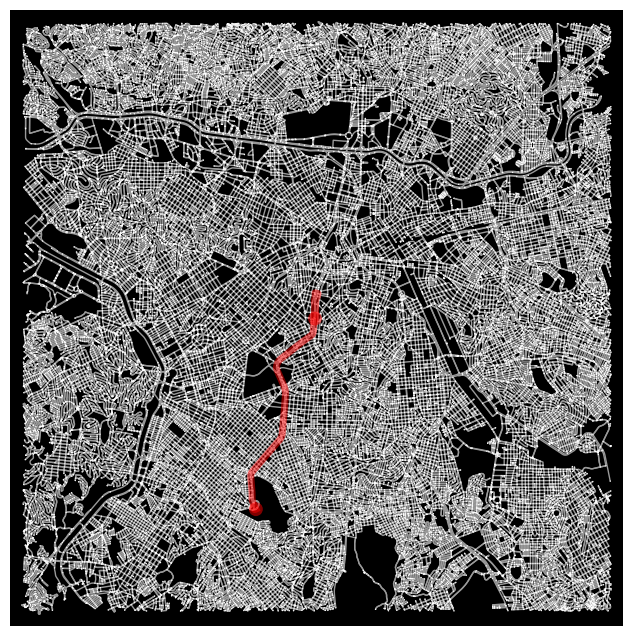

In [15]:
path_lenght = nx.shortest_path(
    G, source=start_node, target=end_node, method="dijkstra", weight="lenght"
)

fig, ax = ox.plot_graph_route(
    G,
    path_lenght,
    route_color="red",
    route_linewidth=5,
    node_size=1,
    bgcolor="black",
    node_color="white",
    figsize=(16, 8),
)

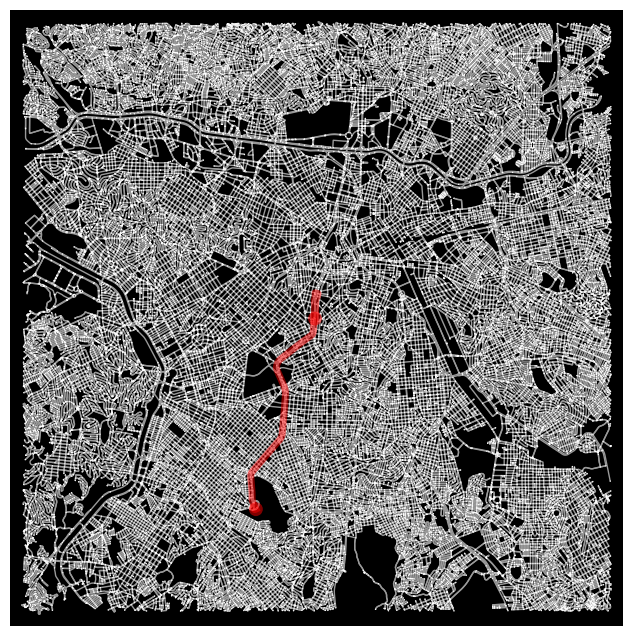

In [16]:
path_time = nx.shortest_path(
    G, source=start_node, target=end_node, method="dijkstra", weight="travel_time"
)

fig, ax = ox.plot_graph_route(
    G,
    path_time,
    route_color="red",
    route_linewidth=5,
    node_size=1,
    bgcolor="black",
    node_color="white",
    figsize=(16, 8),
)

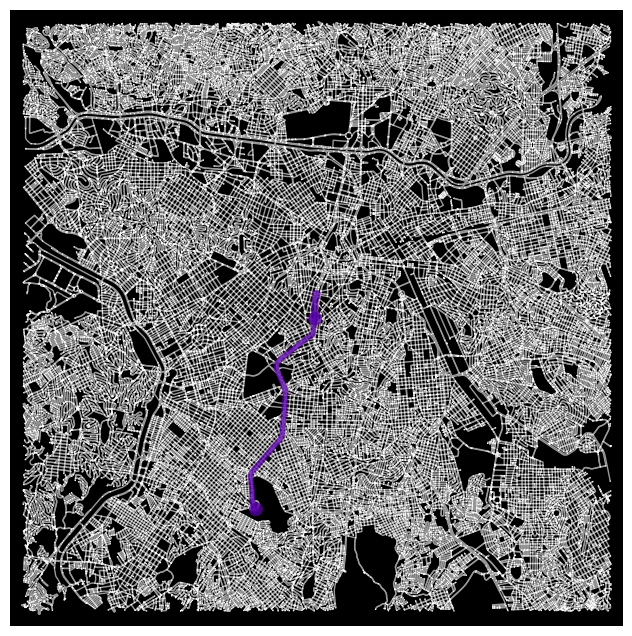

In [17]:
fig, ax = ox.plot_graph_routes(G, routes=[path_lenght, path_time], 
                              route_colors=["red","blue"], 
                              route_linewidth=5, node_size=1, 
                              bgcolor='black', node_color="white", 
                              figsize=(16,8))

In [18]:
ox.plot_route_folium(G, route=path_lenght, route_map=map_, color="red", weight=1)
ox.plot_route_folium(G, route=path_time, route_map=map_, color="blue", weight=1)

map_

/tmp/ipykernel_13126/3720326379.py:1: UserWarning: The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  ox.plot_route_folium(G, route=path_lenght, route_map=map_, color="red", weight=1)
/tmp/ipykernel_13126/3720326379.py:2: UserWarning: The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  ox.plot_route_folium(G, route=path_time, route_map=map_, color="blue", weight=1)


In [19]:
# lst_start, lst_end = [], []
# start_x, start_y = [], []
# end_x, end_y = [], []
# lst_length, lst_time = [], []

# for a, b in zip(route_time[: -1], route_time[1:]):
#     lst_start.append(a)
#     lst_end.append(b)
#     lst_length.append(round(G.edges[(a, b, 0)]["lenght"]))
#     lst_time.append(round(G.edges[(a, b, 0)]["travel_time"]))
#     start_x.append(G.nodes[a]["x"])
#     start_y.append(G.nodes[a]["y"])
#     end_x.append(G.nodes[b]['x'])
#     end_y.append(G.nodes[b]['y'])

# df = pd.DataFrame(list(zip(lst_start, lst_end, 
#                            start_x, start_y, end_x, end_y, 
#                            lst_length, lst_time)), 
#                    columns=["start","end","start_x","start_y",
#                             "end_x","end_y","length","travel_time"]
#                   ).reset_index().rename(columns={"index":"id"})

# df.head()

In [20]:
data_starbucks["node"] = data_starbucks[["y", "x"]].apply(lambda x: 
                           ox.distance.nearest_nodes(G, x[1], x[0]), 
                        axis=1)

data_starbucks = data_starbucks.drop_duplicates("node", keep="first")

data_starbucks.head()

/tmp/ipykernel_13126/1691667501.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ox.distance.nearest_nodes(G, x[1], x[0]),
/tmp/ipykernel_13126/1691667501.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ox.distance.nearest_nodes(G, x[1], x[0]),
/tmp/ipykernel_13126/1691667501.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ox.distance.nearest_nodes(G, x[1], x[0]),
/tmp/ipykernel_13126/1691667501.py:2: FutureWarning: Serie

,id,City,Street Address,y,x,base,node
0,0,Sao Paulo,"Rua Maestro Cardim, 769",-23.57,-46.64,1,778098426
1,1,Sao Paulo,"Av. Washington Luis, s/n, Sagua Central, Vila ...",-23.63,-46.66,0,6361292097
2,2,Sao Paulo,"Av. Paulista, 2.064, Piso Augusta Lojas A-1,A-...",-23.56,-46.66,0,60624596
3,3,Sao Paulo,"Avenida Paulista, 1203",-23.56,-46.65,0,457566731
4,4,Sao Paulo,"Av. Pavao, 667",-23.61,-46.67,0,5080376201


In [21]:
def f(a, b):
    try:
        d = nx.shortest_path_length(G, source=a, target=b, method="dijkstra", weight="travel_time")

    except:
        d = np.nan
    
    return d

distance_matrix = np.asarray([[f(a,b) for b in data_starbucks["node"].tolist()] 
                               for a in data_starbucks["node"].tolist()])

distance_matrix = pd.DataFrame(distance_matrix, 
                               columns=data_starbucks["node"].values, 
                               index=data_starbucks["node"].values)

distance_matrix.head()



,778098426,6361292097,60624596,457566731,5080376201,4279348730,2615693298,1691276598,301650873,25778062,...,4663903407,5994312468,304693470,4246898827,5539086397,1360432237,8062328093,3894483856,2395110368,5087298463
778098426,0.0,608.1,293.9,201.5,520.2,397.5,599.9,NaN,640.0,448.0,...,976.9,799.3,410.0,801.5,234.5,1045.4,543.7,881.7,654.6,593.2
6361292097,506.8,0.0,700.1,664.2,357.8,424.5,1106.7,NaN,509.8,954.8,...,1235.4,1306.1,320.5,570.4,741.3,705.4,561.8,915.7,999.1,430.6
60624596,241.3,673.6,0.0,150.0,554.9,436.4,736.5,NaN,519.1,532.3,...,830.0,935.9,425.3,637.5,228.6,1021.1,410.8,644.1,791.2,480.8
457566731,274.3,707.3,189.7,0.0,599.5,469.4,644.6,NaN,621.2,441.5,...,914.6,844.0,469.9,751.3,137.8,1091.2,524.6,777.5,699.3,550.9
5080376201,399.5,239.3,568.3,547.5,0.0,324.5,999.4,NaN,254.2,847.5,...,979.8,1198.8,141.3,329.6,634.0,576.4,306.2,660.1,903.1,175.0


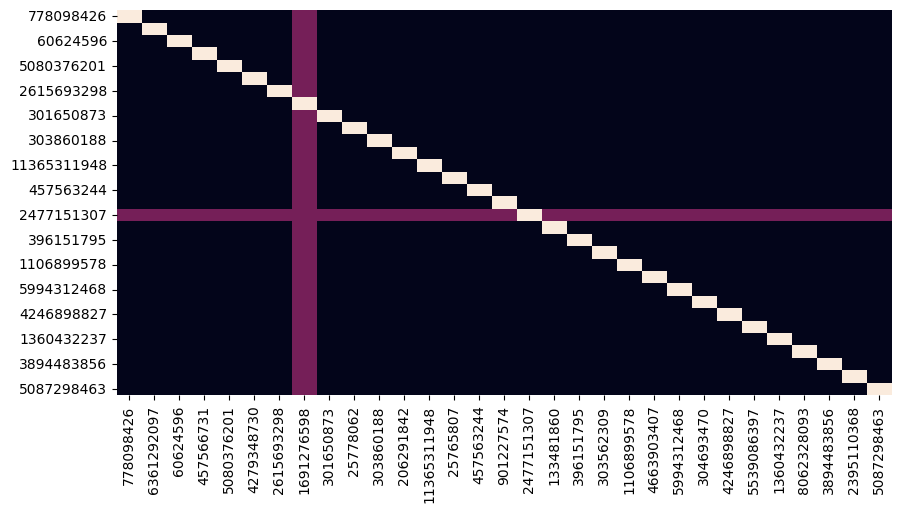

In [22]:
heatmap = distance_matrix.copy()

for col in heatmap.columns:
    heatmap[col] = heatmap[col].apply(lambda x: 
                       0.3 if pd.isnull(x) else  #nan -> purple
                      (0.7 if np.isinf(x) else   #inf -> orange
                      (0 if x!=0 else 1) ))      # 0  -> white  
    
fig, ax = plt.subplots(figsize=(10, 5))
sns.heatmap(heatmap, vmin=0, vmax=1, cbar=False, ax=ax)
plt.show()

In [23]:
distance_matrix = distance_matrix.fillna(distance_matrix.mean().mean())

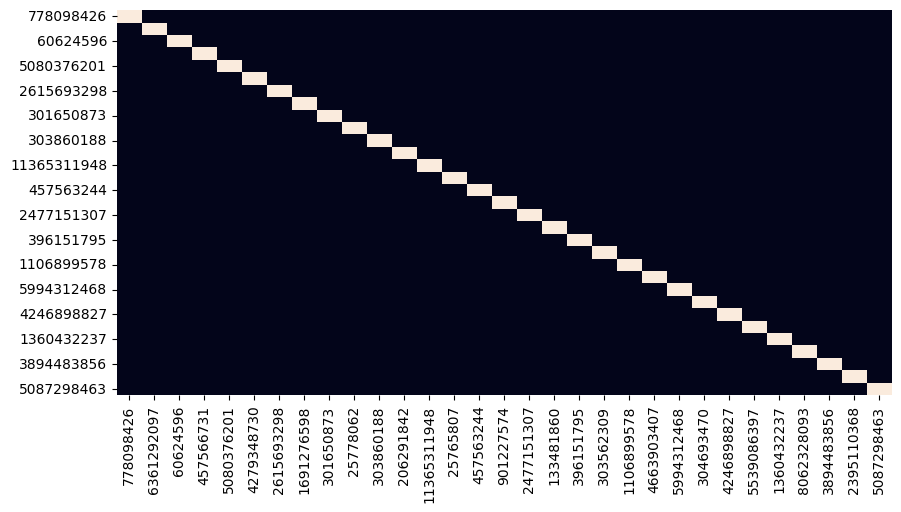

In [24]:
heatmap = distance_matrix.copy()

for col in heatmap.columns:
    heatmap[col] = heatmap[col].apply(lambda x: 
                       0.3 if pd.isnull(x) else  #nan -> purple
                      (0.7 if np.isinf(x) else   #inf -> orange
                      (0 if x!=0 else 1) ))      # 0  -> white  
    
fig, ax = plt.subplots(figsize=(10, 5))
sns.heatmap(heatmap, vmin=0, vmax=1, cbar=False, ax=ax)
plt.show()

In [25]:
drivers = 1

lst_nodes = data_starbucks["node"].tolist()
print("start:", start_node, "| tot locations to visit:", 
     len(lst_nodes)-1, "| drivers:", drivers)

start: 778098426 | tot locations to visit: 30 | drivers: 1


In [26]:
manager = pywrapcp.RoutingIndexManager(len(lst_nodes), drivers, lst_nodes.index(start_node))

model = pywrapcp.RoutingModel(manager)

In [27]:
def get_distance(from_index, to_index):
    return distance_matrix.iloc[from_index, to_index]

distance = model.RegisterTransitCallback(get_distance)
model.SetArcCostEvaluatorOfAllVehicles(distance)

parameters = pywrapcp.DefaultRoutingSearchParameters()
parameters.first_solution_strategy = (routing_enums_pb2.FirstSolutionStrategy.PATH_CHEAPEST_ARC)


In [28]:
solution = model.SolveWithParameters(parameters)

index = model.Start(0)
print("Route for Driver:")
route_idx, route_distance = [], 0
while not model.IsEnd(index):
    route_idx.append(manager.IndexToNode(index))
    previous_index = index
    index = solution.Value(model.NextVar(index))

    try:
        route_distance += get_distance(previous_index, index)
    
    except:
        route_distance += model.GetArcCostForVehicle(
                              from_index=previous_index, 
                              to_index=index, 
                              vehicle=0)
print(route_idx)
print(f'Total distance: {round(route_distance/1000,2)} km')
print(f'Nodes visited: {len(route_idx)}')

Route for Driver:
[0, 30, 29, 28, 27, 26, 25, 24, 23, 22, 21, 20, 19, 18, 17, 16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Total distance: 21.77 km
Nodes visited: 31


In [29]:
print("Route for driver (nodes):")
lst_route = [lst_nodes[i] for i in route_idx]
print(lst_route)

Route for driver (nodes):
[778098426, 5087298463, 2395110368, 3894483856, 8062328093, 1360432237, 5539086397, 4246898827, 304693470, 5994312468, 4663903407, 1106899578, 303562309, 396151795, 133481860, 2477151307, 901227574, 457563244, 25765807, 11365311948, 206291842, 303860188, 25778062, 301650873, 1691276598, 2615693298, 4279348730, 5080376201, 457566731, 60624596, 6361292097]


In [30]:
# Get path between nodes
def get_path_between_nodes(lst_route):
    lst_paths = []
    for i in range(len(lst_route)):
        try:
            a, b = lst_nodes[i], lst_nodes[i+1]
        except:
            break
        try:
            path = nx.shortest_path(G, source=a, target=b, 
                                    method='dijkstra', 
                                    weight='travel_time')
            if len(path) > 1:
                lst_paths.append(path)
        except:
            continue
    return lst_paths

lst_paths = get_path_between_nodes(lst_route)


# Add paths on the map
for path in lst_paths:
    ox.plot_route_folium(G, route=path, route_map=map_, 
                         color="blue", weight=1)
map_

/tmp/ipykernel_13126/2968534808.py:24: UserWarning: The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  ox.plot_route_folium(G, route=path, route_map=map_,
/tmp/ipykernel_13126/2968534808.py:24: UserWarning: The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  ox.plot_route_folium(G, route=path, route_map=map_,
/tmp/ipykernel_13126/2968534808.py:24: UserWarning: The `fol

In [31]:
drivers = 3
driver_capacities = [20,20,20]
demands = [0] + [1]*(len(lst_nodes)-1)
max_distance = 1000

In [32]:
manager = pywrapcp.RoutingIndexManager(len(lst_nodes), 
                                       drivers, 
                                       lst_nodes.index(start_node))
model = pywrapcp.RoutingModel(manager)

def get_distance(from_index, to_index):
    return distance_matrix.iloc[from_index,to_index]

distance = model.RegisterTransitCallback(get_distance)
model.SetArcCostEvaluatorOfAllVehicles(distance)

In [33]:
def get_demand(from_index):
    return demands[from_index]

demand = model.RegisterUnaryTransitCallback(get_demand)
model.AddDimensionWithVehicleCapacity(demand, slack_max=0, 
                                     vehicle_capacities=driver_capacities, 
                                     fix_start_cumul_to_zero=True,
                                     name='Capacity')

name = 'Distance'
model.AddDimension(distance, slack_max=0, capacity=max_distance, 
                   fix_start_cumul_to_zero=True, name=name)
distance_dimension = model.GetDimensionOrDie(name)
distance_dimension.SetGlobalSpanCostCoefficient(100)

parameters = pywrapcp.DefaultRoutingSearchParameters()
parameters.first_solution_strategy = (
          routing_enums_pb2.FirstSolutionStrategy.PATH_CHEAPEST_ARC
)
solution = model.SolveWithParameters(parameters)

In [34]:
dic_routes_idx, total_distance, total_load = {}, 0, 0
for driver in range(drivers):
    print(f'Route for driver {driver}:')
    index = model.Start(driver)
    route_idx, route_distance, route_load = [], 0, 0
    while not model.IsEnd(index):
        node_index = manager.IndexToNode(index)
        route_idx.append( manager.IndexToNode(index) )
        previous_index = index
        index = solution.Value( model.NextVar(index) )
        ### update distance
        try:
            route_distance += get_distance(previous_index, index)
        except:
            route_distance += model.GetArcCostForVehicle(
                                from_index=previous_index, 
                                to_index=index, 
                                vehicle=driver)
        ### update load
        route_load += demands[node_index]
        
    route_idx.append( manager.IndexToNode(index) )
    print(route_idx)
    dic_routes_idx[driver] = route_idx
    print(f'distance: {round(route_distance/1000,2)} km')
    print(f'load: {round(route_load,2)}', "\n")
    total_distance += route_distance
    total_load += route_load
    
print(f'Total distance: {round(total_distance/1000,2)} km')
print(f'Total load: {total_load}')

Route for driver 0:
[0, 0]
distance: 0.0 km
load: 0 

Route for driver 1:
[0, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1, 0]
distance: 5.67 km
load: 10 

Route for driver 2:
[0, 30, 29, 28, 27, 26, 25, 24, 23, 22, 21, 20, 19, 18, 17, 16, 15, 14, 13, 12, 11, 0]
distance: 14.93 km
load: 20 

Total distance: 20.6 km
Total load: 30


In [35]:
dic_route = {}
for k,v in dic_routes_idx.items():
    print(f"Route for driver {k} (nodes):")
    dic_route[k] = [lst_nodes[i] for i in v]
    print(dic_route[k], "\n")

Route for driver 0 (nodes):
[778098426, 778098426] 

Route for driver 1 (nodes):
[778098426, 303860188, 25778062, 301650873, 1691276598, 2615693298, 4279348730, 5080376201, 457566731, 60624596, 6361292097, 778098426] 

Route for driver 2 (nodes):
[778098426, 5087298463, 2395110368, 3894483856, 8062328093, 1360432237, 5539086397, 4246898827, 304693470, 5994312468, 4663903407, 1106899578, 303562309, 396151795, 133481860, 2477151307, 901227574, 457563244, 25765807, 11365311948, 206291842, 778098426] 



In [36]:
dic_paths = {k:get_path_between_nodes(v) for k,v in dic_route.items()}

# Add paths on the map
lst_colors = ["red","green","blue"]
for k,v in dic_paths.items():
    for path in v:
        ox.plot_route_folium(G, route=path, route_map=map_, 
                             color=lst_colors[k], weight=1)
map_

/tmp/ipykernel_13126/1344153145.py:7: UserWarning: The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  ox.plot_route_folium(G, route=path, route_map=map_,
/tmp/ipykernel_13126/1344153145.py:7: UserWarning: The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  ox.plot_route_folium(G, route=path, route_map=map_,
/tmp/ipykernel_13126/1344153145.py:7: UserWarning: The `folium

In [37]:
def df_animation_multiple_path(G, lst_paths, parallel=True):
    df = pd.DataFrame()
    for path in lst_paths:
        lst_start, lst_end = [],[]
        start_x, start_y = [],[]
        end_x, end_y = [],[]
        lst_length, lst_time = [],[]

        for a,b in zip(path[:-1], path[1:]):
            lst_start.append(a)
            lst_end.append(b)
            lst_length.append(round(G.edges[(a,b,0)]['length']))
            lst_time.append(round(G.edges[(a,b,0)]['travel_time']))
            start_x.append(G.nodes[a]['x'])
            start_y.append(G.nodes[a]['y'])
            end_x.append(G.nodes[b]['x'])
            end_y.append(G.nodes[b]['y'])

        tmp = pd.DataFrame(list(zip(lst_start, lst_end, 
                                    start_x, start_y, 
                                    end_x, end_y, 
                                    lst_length, lst_time)), 
                           columns=["start","end","start_x","start_y",
                                    "end_x","end_y","length","travel_time"]
                          )
        df = pd.concat([df,tmp], ignore_index=(not parallel))

    df = df.reset_index().rename(columns={"index":"id"})
    return df

In [38]:
def plot_animation(df, start_node, end_node):
    df_start = df[df["start"] == start_node]
    df_end = df[df["end"] == end_node]
    
    fig = px.scatter_mapbox(data_frame=df, lon="start_x", lat="start_y", zoom=15, width=1000, height=800, 
                            animation_frame="id", mapbox_style="carto-positron")
    fig.data[0].marker = {"size":12}
    fig.add_trace(px.scatter_mapbox(data_frame=df_start, lon="start_x", lat="start_y").data[0])
    fig.data[1].marker = {"size":15, "color":"red"}
    fig.add_trace(px.scatter_mapbox(data_frame=df_end, lon="start_x", lat="start_y").data[0])
    fig.data[2].marker = {"size":15, "color":"green"}
    fig.add_trace(px.line_mapbox(data_frame=df, lon="start_x", lat="start_y").data[0])
    return fig

In [39]:
df = pd.DataFrame()
for driver,lst_paths in dic_paths.items():
    tmp = df_animation_multiple_path(G, lst_paths, parallel=False)
    df = pd.concat([df,tmp], axis=0)

first_node, last_node = lst_paths[0][0], lst_paths[-1][-1]
plot_animation(df, first_node, last_node)